In [2]:
"""
simulation.main
===============
Full 2D active-droplet simulation.

Diffusion PDE for the chemical trail + stochastic SDE for droplet motion.
Uses FEniCSx (DOLFINx) with PETSc for the PDE and PyVista for visualisation.

This version is tuned to look more like the paper figures:
- clustered initial injection
- shorter time window
- stronger short-time randomness
- trail-driven self-avoidance
- no artificial heading-angle propulsion

Call ``run_simulation()`` to execute.
"""

from mpi4py import MPI
from petsc4py.PETSc import ScalarType

import os
from pathlib import Path

from dolfinx import mesh, fem, plot
from dolfinx.fem.petsc import LinearProblem

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pyvista
import ufl
from tqdm import tqdm

# ── local imports ────────────────────────────────────────
from simulation.utils import (
    initial_condition,
    update_paper_parameters,
    save_trajectory_csv,
)


# =========================================================
# Main simulation entry point
# =========================================================
def run_simulation(beta = 400.0,
                   sigma = 5e-2,
                   output = 'data'):
    """
    Run the complete active-droplet simulation.

    Workflow
    --------
    1. Build the FE mesh and function space
    2. Place droplets at clustered initial positions
    3. Time-step: solve diffusion PDE → compute gradient forces → SDE update
    4. Record an animated GIF and final-field screenshot
    5. Save trajectory data (.npz and .csv)
    """

    # =========================================================
    # Output location
    # =========================================================
    # output = 'simulation data'
    os.makedirs(output, exist_ok=True)

    # =========================================================
    # Simulation settings
    # =========================================================
    Ndrop = 6
    seed = 4
    np.random.seed(seed)

    Nx = 200
    Ny = 200

    dt_val = 0.002          # closer to the paper's time scale
    frame_every = 1

    # =========================================================
    # Physical parameters (dimensionless)
    # =========================================================

    D_val = 1e-5

    # beta = 400.0
    # sigma = 5e-2

    T = 2.0                # shorter lifetime => less spaghetti

    R0 = 0.040
    Rshrink = 2.5e-4
    Rmin = 0.008

    delta = 0.060
    eta = 1.0


    # =========================================================
    # Mesh and finite-element space
    # =========================================================
    domain = mesh.create_unit_square(MPI.COMM_WORLD, Nx, Ny)
    comm = domain.comm

    V = fem.functionspace(domain, ("Lagrange", 1))

    un = fem.Function(V)
    un.interpolate(initial_condition)

    uh = fem.Function(V)

    u = ufl.TrialFunction(V)
    v = ufl.TestFunction(V)

    # =========================================================
    # Time constants used by the PDE solve
    # =========================================================
    dt = fem.Constant(domain, ScalarType(dt_val))
    D = fem.Constant(domain, ScalarType(D_val))

    # =========================================================
    # Initial droplet positions
    # Central injection, like the paper's multiple-droplet setup
    # =========================================================
    x0 = np.clip(0.50 + 0.03 * np.random.randn(Ndrop), 0.30, 0.70)
    y0 = np.clip(0.50 + 0.03 * np.random.randn(Ndrop), 0.30, 0.70)

    X = [fem.Constant(domain, ScalarType(x0[i])) for i in range(Ndrop)]
    Y = [fem.Constant(domain, ScalarType(y0[i])) for i in range(Ndrop)]
    R = [fem.Constant(domain, ScalarType(R0)) for _ in range(Ndrop)]
    alpha = [fem.Constant(domain, ScalarType(0.0)) for _ in range(Ndrop)]
    gamma_c = [fem.Constant(domain, ScalarType(1.0)) for _ in range(Ndrop)]

    # =========================================================
    # Coordinates and PDE source terms
    # =========================================================
    x_coord = ufl.SpatialCoordinate(domain)
    source = 0
    Fx_forms = []
    Fy_forms = []

    for i in range(Ndrop):
        r2 = (x_coord[0] - X[i])**2 + (x_coord[1] - Y[i])**2

        Gi = (1.0 / (2.0 * np.pi * R[i]**2)) * ufl.exp(
            -r2 / (2.0 * R[i]**2)
        )

        source += alpha[i] * Gi

        Fx_forms.append(fem.form(Gi * ufl.grad(uh)[0] * ufl.dx))
        Fy_forms.append(fem.form(Gi * ufl.grad(uh)[1] * ufl.dx))

    # =========================================================
    # Weak form and linear solver
    # =========================================================
    a = (u * v + dt * D * ufl.dot(ufl.grad(u), ufl.grad(v))) * ufl.dx
    L = (un * v + dt * source * v) * ufl.dx
    problem = LinearProblem(
        a,
        L,
        u=uh,
        petsc_options_prefix="diffusion_",
        petsc_options={"ksp_type": "preonly", "pc_type": "lu"},
    )

    # =========================================================
    # PyVista visualisation setup
    # =========================================================
    topology, cells, geometry = plot.vtk_mesh(V)
    grid = pyvista.UnstructuredGrid(topology, cells, geometry)
    grid.point_data["u"] = un.x.array.copy()

    plotter = pyvista.Plotter(off_screen=True, window_size=(700, 700))
    viridis = mpl.colormaps["viridis"]

    actor = plotter.add_mesh(
        grid,
        cmap=viridis,
        show_edges=False,
        lighting=False,
        clim=[0, 0.02],
    )

    xc = [float(X[i].value) for i in range(Ndrop)]
    yc = [float(Y[i].value) for i in range(Ndrop)]
    walker_points = pyvista.PolyData(np.c_[xc, yc, np.zeros(Ndrop)])

    plotter.add_mesh(
        walker_points,
        color="white",
        point_size=12,
        render_points_as_spheres=True,
    )

    plotter.view_xy()
    plotter.add_text(
        "Frame: 0  t = 0.00",
        position="upper_left",
        font_size=10,
        color="white",
        name="frame_text",
    )
    plotter.open_gif(os.path.join(output, "multi_droplet_active.gif"))

    # =========================================================
    # Trajectory storage
    # =========================================================
    trajectory_x = [[] for _ in range(Ndrop)]
    trajectory_y = [[] for _ in range(Ndrop)]

    # =========================================================
    # Time stepping
    # =========================================================
    num_steps = int(T / dt_val)
    t = 0.0

    for step in tqdm(range(num_steps)):
        t += dt_val

        # Update paper-style shrinking parameters
        Rval, alphaval, gammaval = update_paper_parameters(
            t=t, R0=R0, Rshrink=Rshrink, Rmin=Rmin, delta=delta, eta=eta
        )

        for i in range(Ndrop):
            R[i].value = ScalarType(Rval)
            alpha[i].value = ScalarType(alphaval)
            gamma_c[i].value = ScalarType(gammaval)

        # Solve diffusion PDE
        problem.solve()
        un.x.array[:] = uh.x.array

        # Assemble gradient force on each droplet
        Fx = np.zeros(Ndrop)
        Fy = np.zeros(Ndrop)

        for i in range(Ndrop):
            Fx[i] = comm.allreduce(fem.assemble_scalar(Fx_forms[i]), op=MPI.SUM)
            Fy[i] = comm.allreduce(fem.assemble_scalar(Fy_forms[i]), op=MPI.SUM)

        # SDE update: trail-driven drift + noise
        drift_prefactor = beta * (Rval**2) / (delta**2) / gammaval
        noise_scale = np.sqrt(sigma * dt_val) / gammaval

        for i in range(Ndrop):
            Xnew = float(X[i].value) - dt_val * drift_prefactor * Fx[i] + noise_scale * np.random.randn()
            Ynew = float(Y[i].value) - dt_val * drift_prefactor * Fy[i] + noise_scale * np.random.randn()

            # Reflecting boundaries
            if Xnew < 0:
                Xnew = -Xnew
            if Xnew > 1:
                Xnew = 2 - Xnew

            if Ynew < 0:
                Ynew = -Ynew
            if Ynew > 1:
                Ynew = 2 - Ynew

            Xnew = min(max(Xnew, 0.0), 1.0)
            Ynew = min(max(Ynew, 0.0), 1.0)

            X[i].value = ScalarType(Xnew)
            Y[i].value = ScalarType(Ynew)

            trajectory_x[i].append(Xnew)
            trajectory_y[i].append(Ynew)

        # Render frame
        if step % frame_every == 0:
            scalars = uh.x.array.copy()
            grid.point_data["u"] = scalars
            actor.mapper.scalar_range = (0.0, max(float(np.max(scalars)), 1e-12))

            xc = [float(X[i].value) for i in range(Ndrop)]
            yc = [float(Y[i].value) for i in range(Ndrop)]
            walker_points.points = np.c_[xc, yc, np.zeros(Ndrop)]
            walker_points.Modified()

            plotter.add_text(
                f"Frame: {step // frame_every}  t = {t:.2f}",
                position="upper_left",
                font_size=10,
                color="white",
                name="frame_text",
            )
            plotter.write_frame()

    plotter.screenshot(os.path.join(output, "final_field.png"))
    plotter.close()

    # =========================================================
    # Plot trajectories
    # =========================================================
    plt.figure(figsize=(8, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, Ndrop))

    for i in range(Ndrop):
        plt.plot(
            trajectory_x[i],
            trajectory_y[i],
            linewidth=1.0,
            color=colors[i % len(colors)],
        )

    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.gca().set_aspect("equal")
    plt.title(f"{Ndrop} non-Markovian active droplets (2D)")
    plt.savefig(os.path.join(output, f"droplet_{Ndrop}_trajectories.png"), dpi=150)
    plt.show()

    save_trajectory_csv(
        trajectory_x=trajectory_x,
        trajectory_y=trajectory_y,
        dt_val=dt_val,
        Ndrop=Ndrop,
        output_path=os.path.join(output, f"droplet_{Ndrop}_tracking.csv"),
    )
    np.savez(
        os.path.join(output, f"data_droplet_{Ndrop}_trajectories.npz"),
        trajectory_x=np.array(trajectory_x, dtype=object),
        trajectory_y=np.array(trajectory_y, dtype=object),
    )

    print(f"Saving data_droplet_{Ndrop}_trajectories.npz and \ndroplet_{Ndrop}_tracking.csv in {output} folder")


100%|██████████| 1000/1000 [06:14<00:00,  2.67it/s]


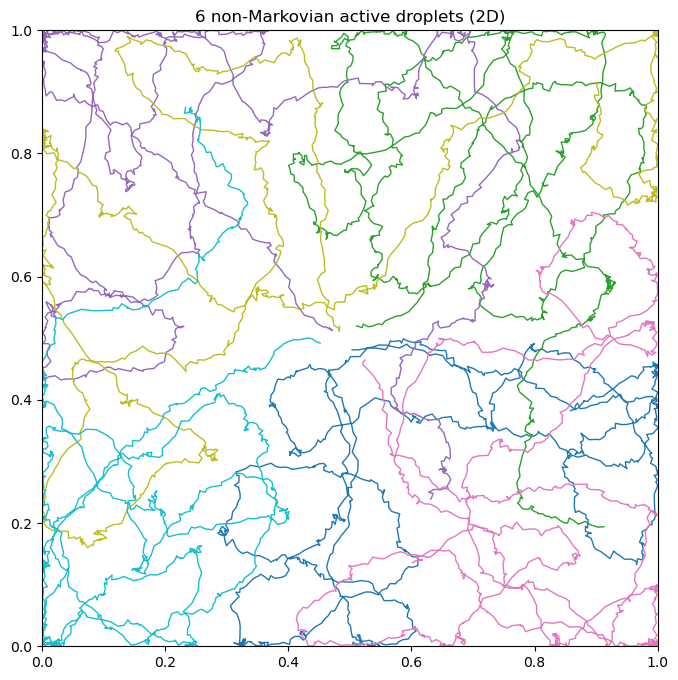

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.005/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.005 folder


100%|██████████| 1000/1000 [06:26<00:00,  2.59it/s]


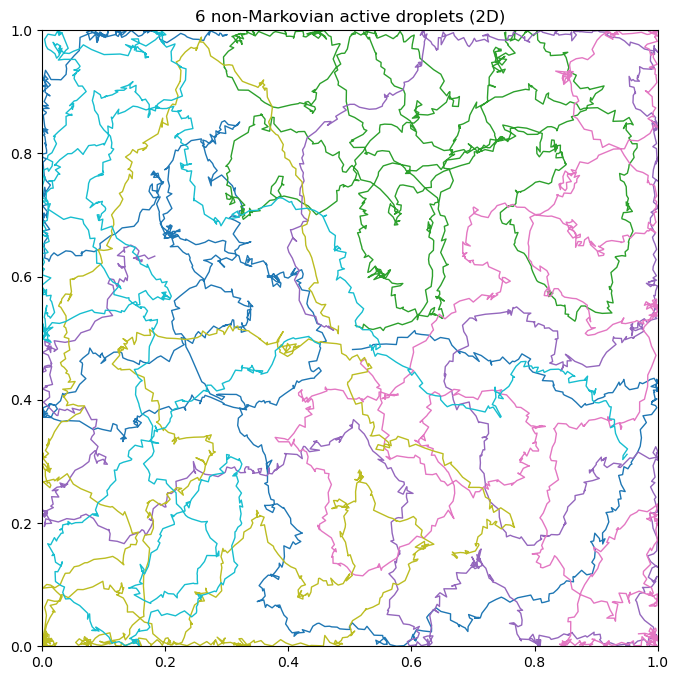

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.01/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.01 folder


100%|██████████| 1000/1000 [06:04<00:00,  2.74it/s]


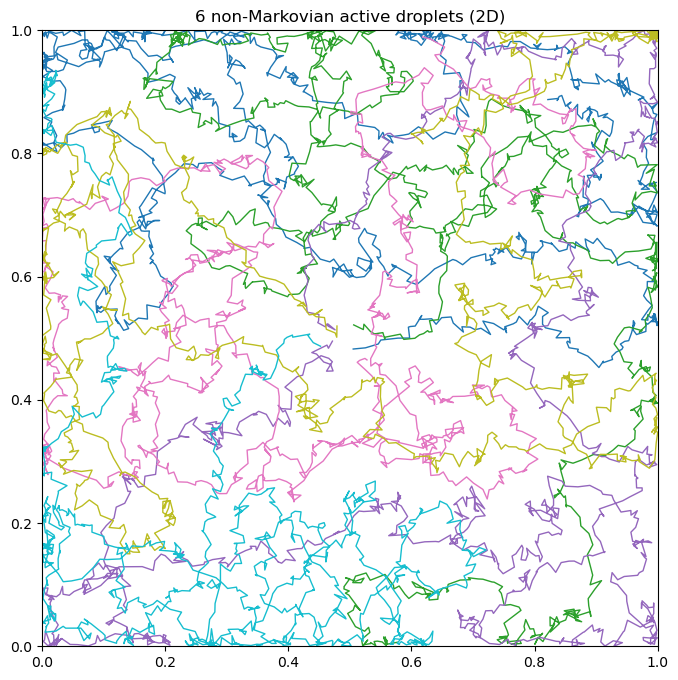

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.02/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.02 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


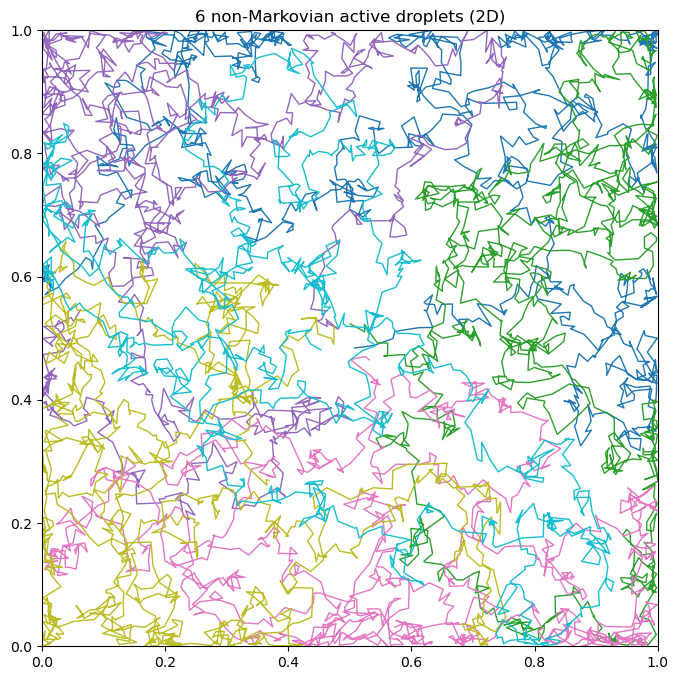

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.05/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.05 folder


100%|██████████| 1000/1000 [06:04<00:00,  2.74it/s]


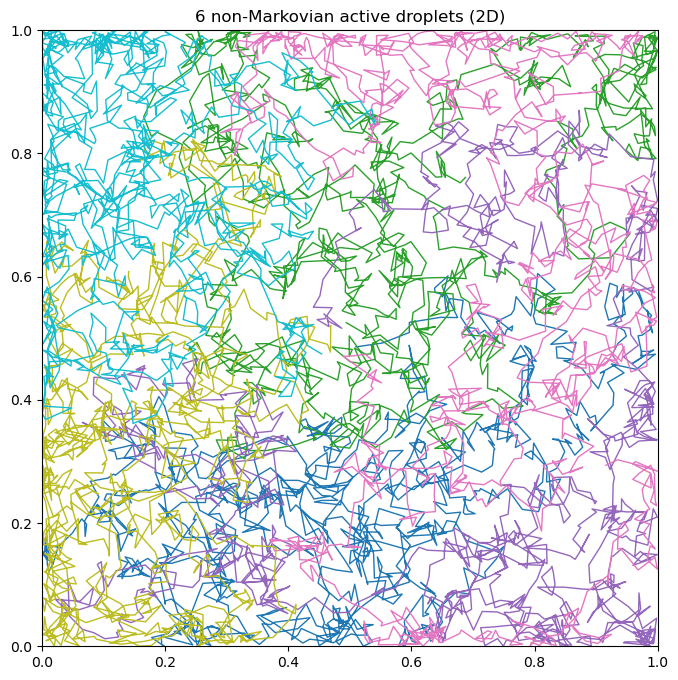

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.1/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_50_Sigma_0.1 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.72it/s]


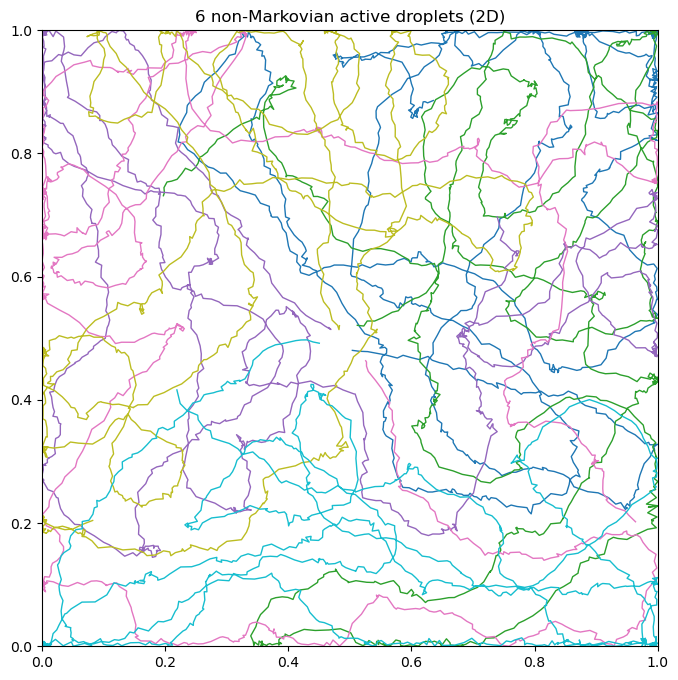

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.005/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.005 folder


100%|██████████| 1000/1000 [06:05<00:00,  2.74it/s]


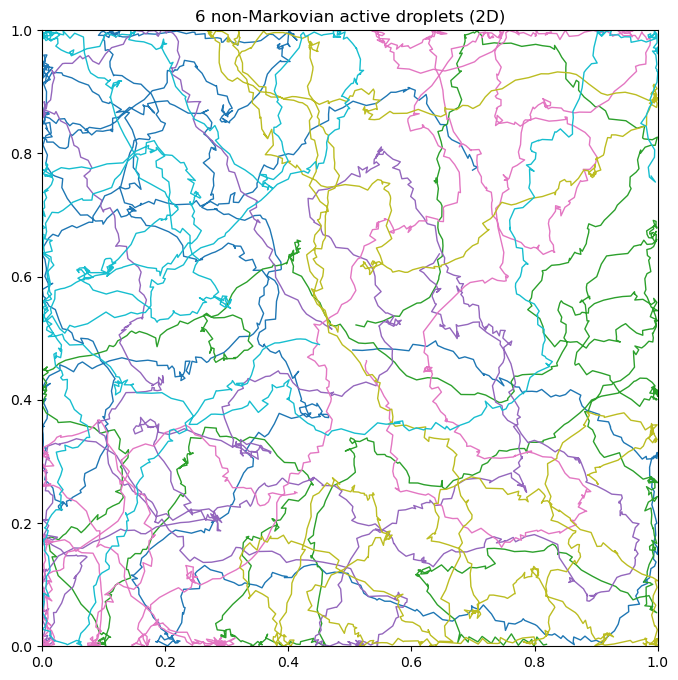

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.01/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.01 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


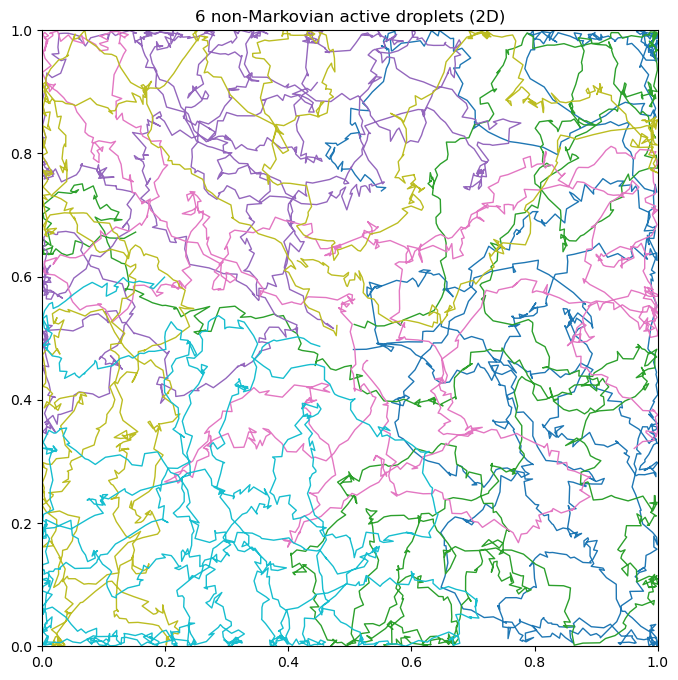

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.02/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.02 folder


100%|██████████| 1000/1000 [06:05<00:00,  2.74it/s]


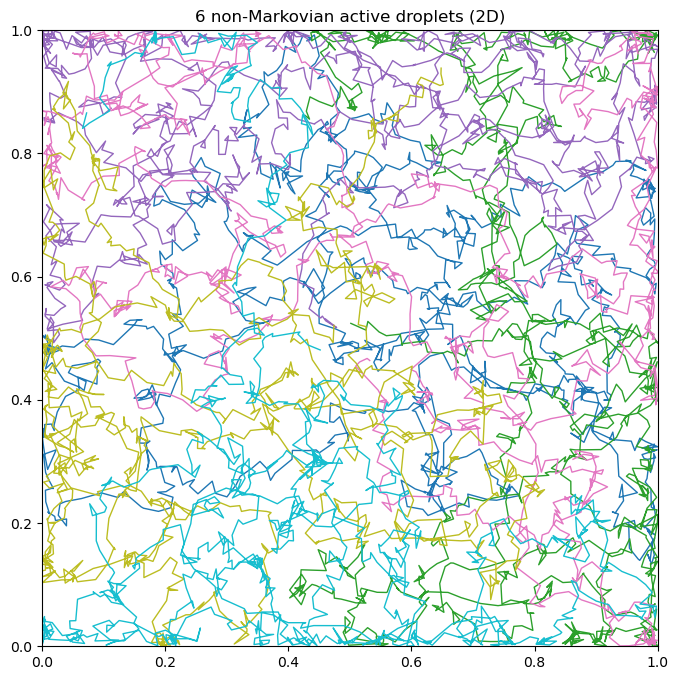

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.05/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.05 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


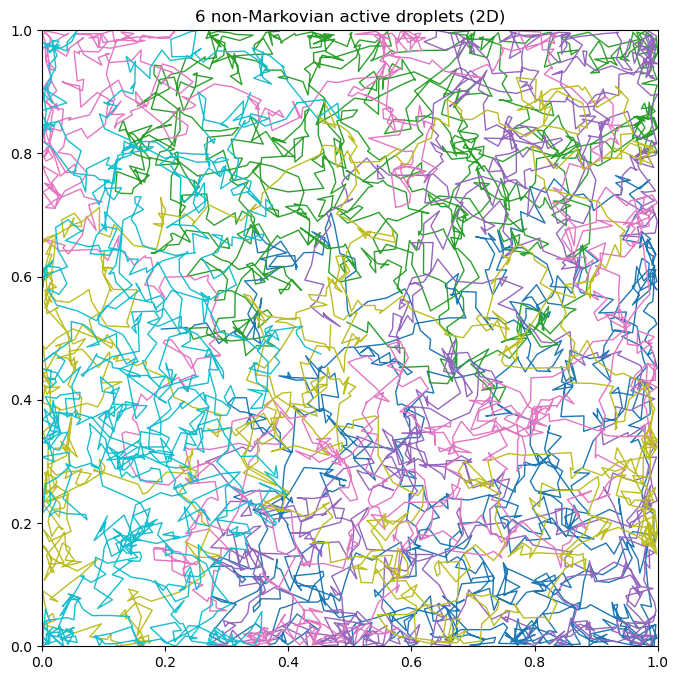

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.1/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_100_Sigma_0.1 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


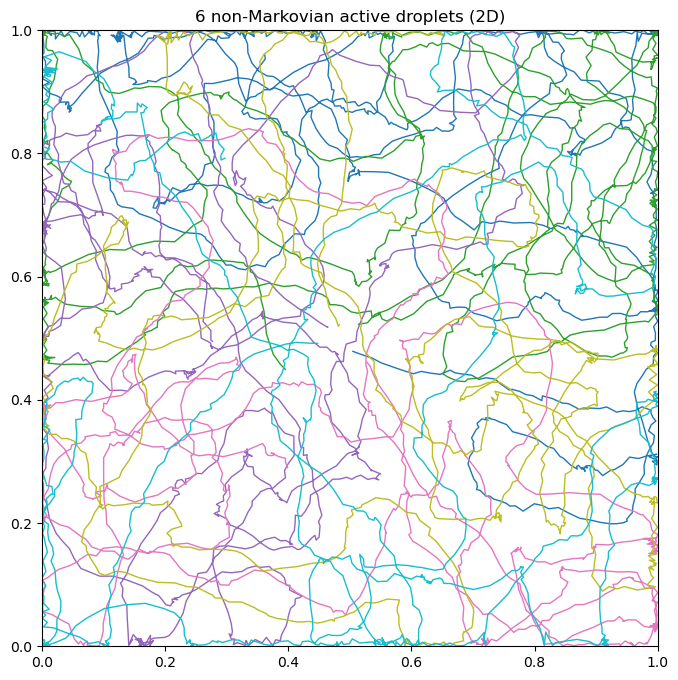

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.005/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.005 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


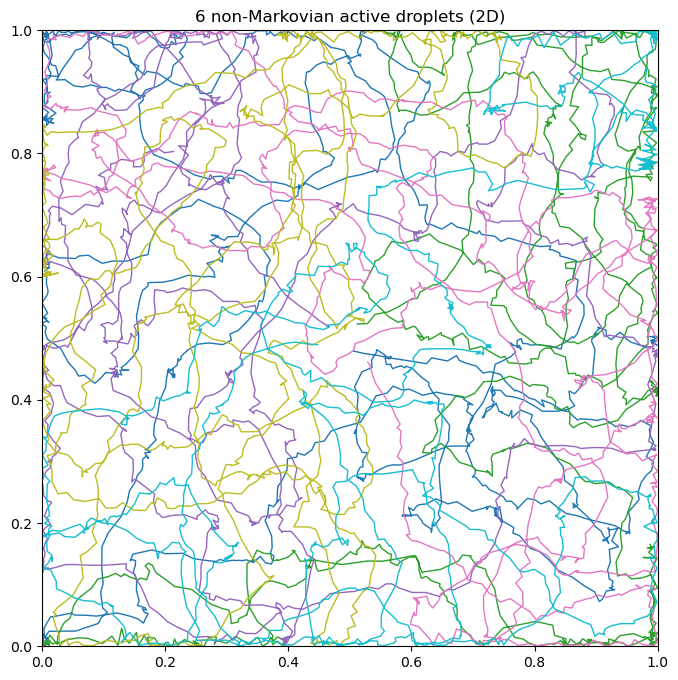

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.01/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.01 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


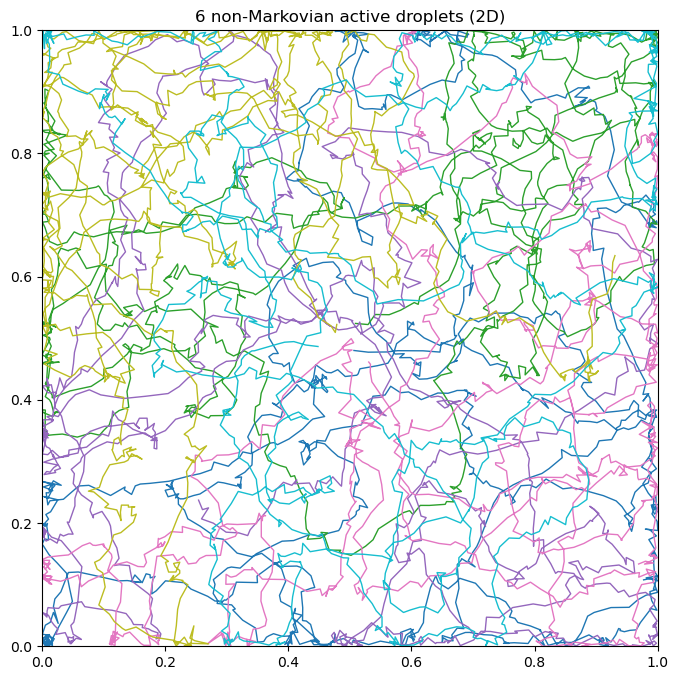

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.02/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.02 folder


100%|██████████| 1000/1000 [06:08<00:00,  2.72it/s]


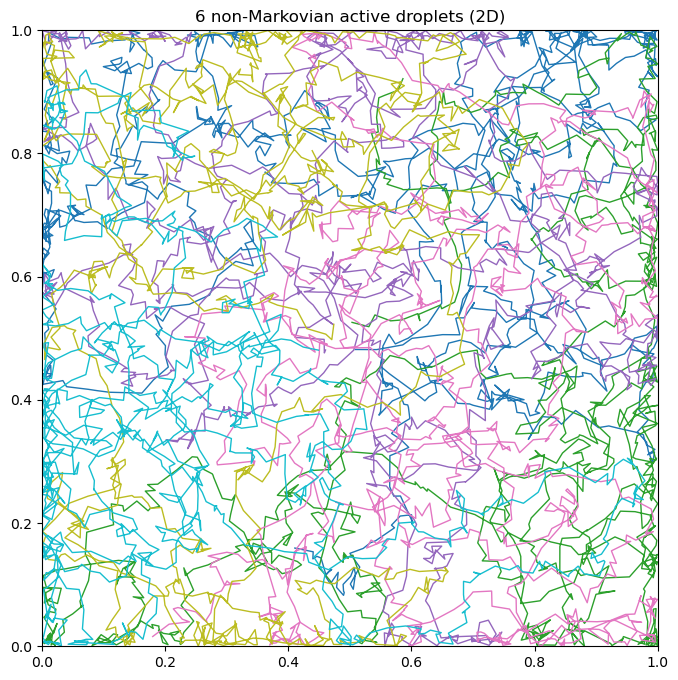

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.05/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.05 folder


100%|██████████| 1000/1000 [06:07<00:00,  2.72it/s]


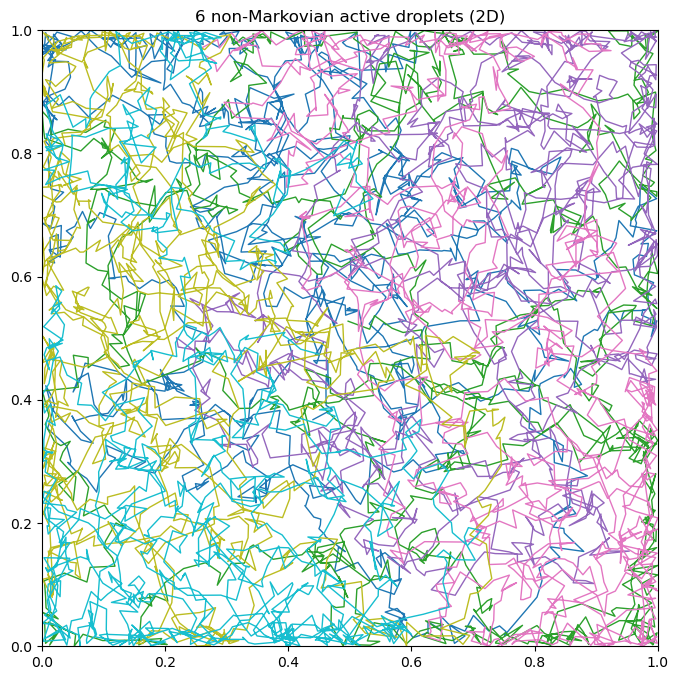

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.1/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_200_Sigma_0.1 folder


100%|██████████| 1000/1000 [06:04<00:00,  2.74it/s]


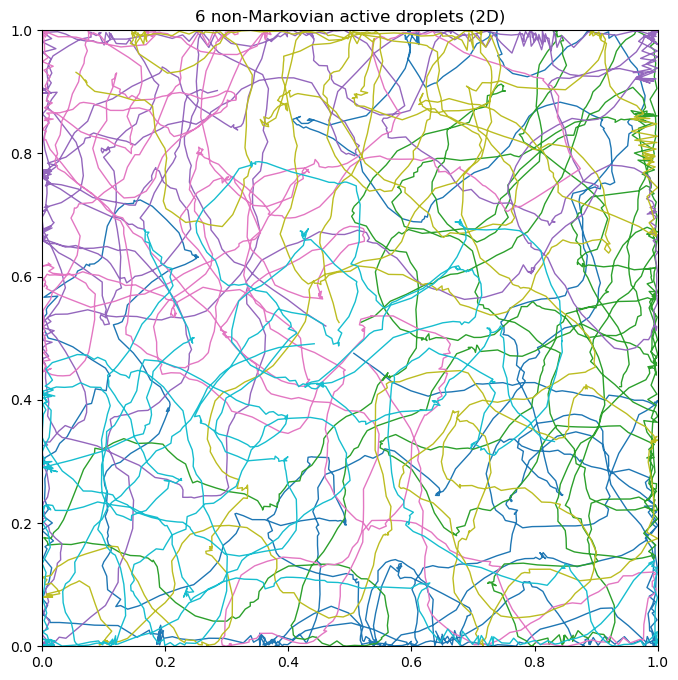

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.005/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.005 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


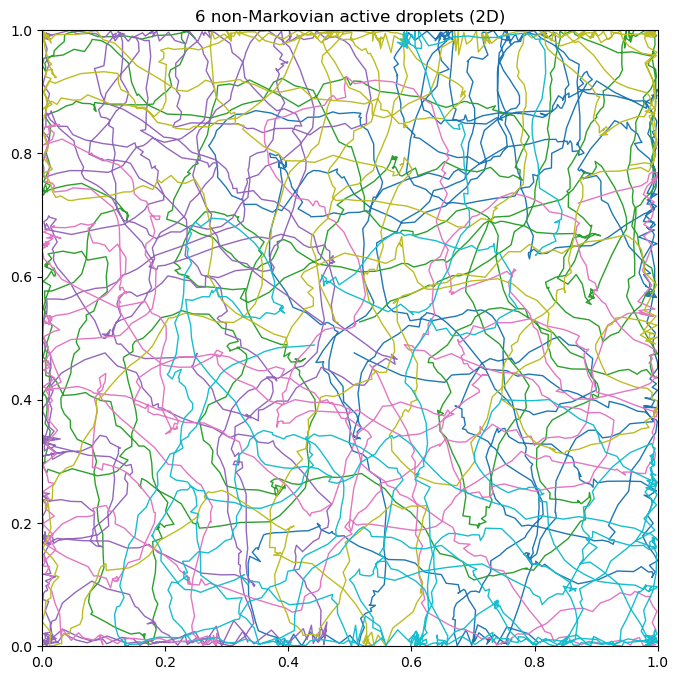

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.01/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.01 folder


100%|██████████| 1000/1000 [06:04<00:00,  2.74it/s]


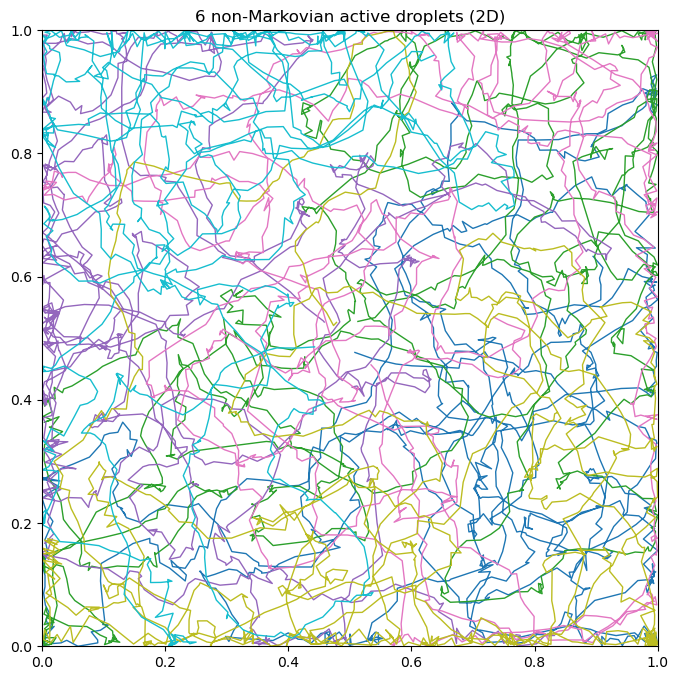

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.02/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.02 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


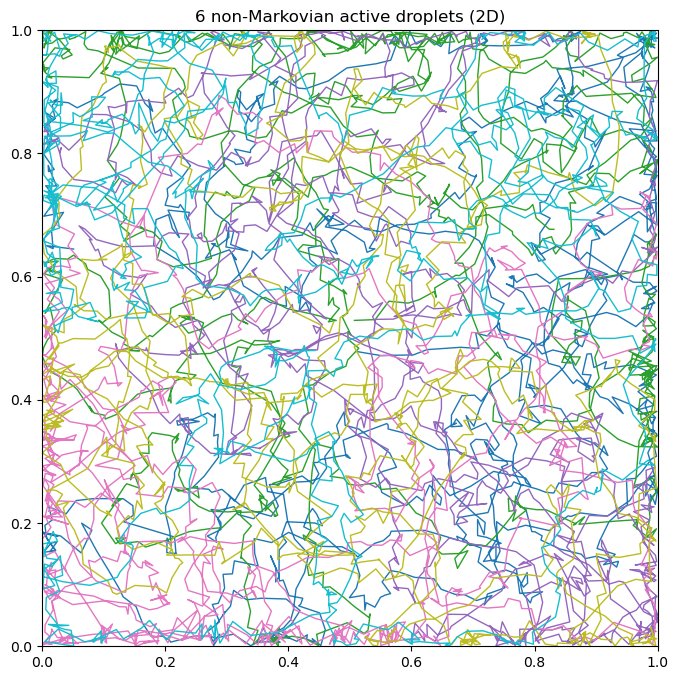

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.05/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.05 folder


100%|██████████| 1000/1000 [06:05<00:00,  2.74it/s]


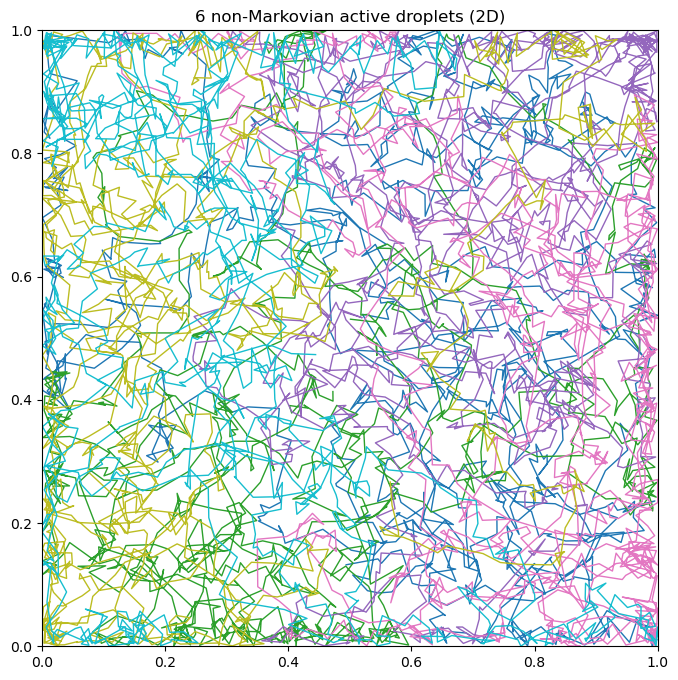

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.1/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_400_Sigma_0.1 folder


100%|██████████| 1000/1000 [06:05<00:00,  2.73it/s]


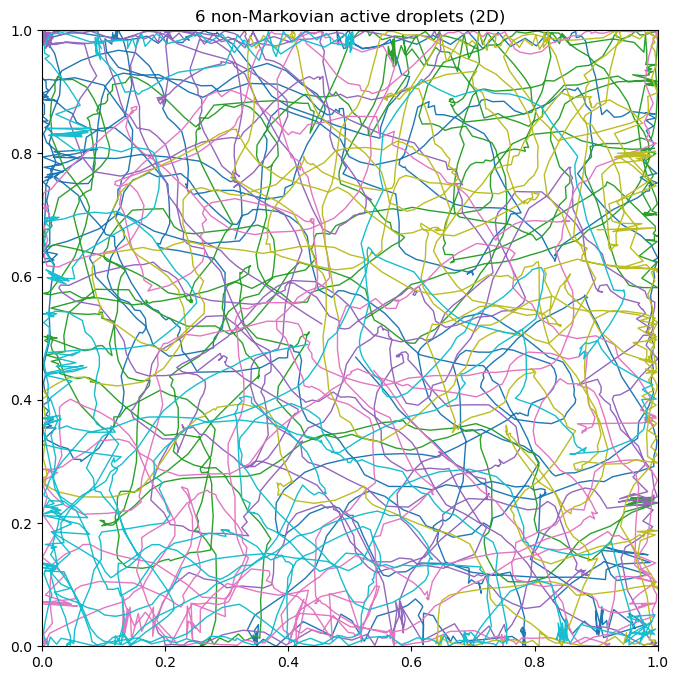

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_800_Sigma_0.005/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_800_Sigma_0.005 folder


100%|██████████| 1000/1000 [06:06<00:00,  2.73it/s]


In [ ]:
beta_list = [50, 100, 200, 400, 800]
sigma_list = [0.005, 0.01, 0.02, 0.05, 0.1]

parent_dir = 'simulation_for_diff_beta_sigma'
os.makedirs(parent_dir,exist_ok=True)

for beta in beta_list:
    for sigma in sigma_list:
        run_simulation(beta=beta,sigma=sigma,output=f'./{parent_dir}/forBeta_{beta}_Sigma_{sigma}')


100%|██████████| 1000/1000 [06:10<00:00,  2.70it/s]


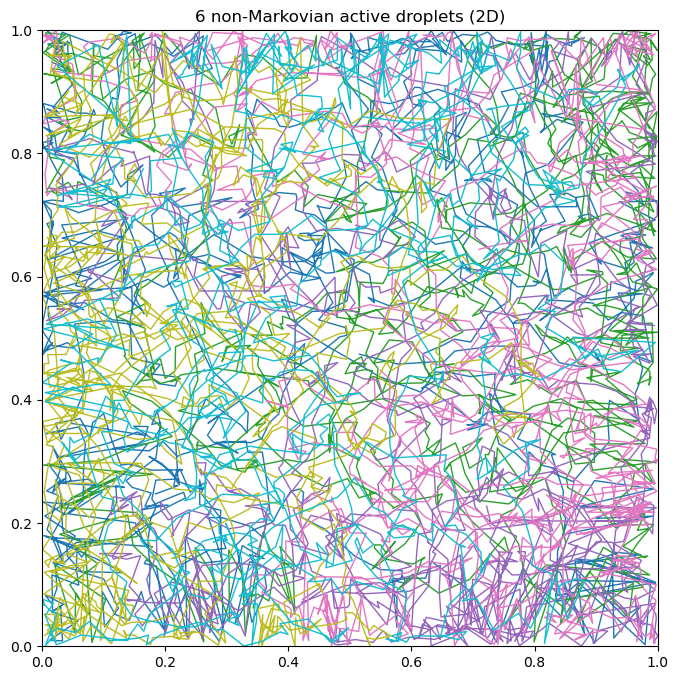

CSV saved to: ./simulation_for_diff_beta_sigma/forBeta_800_Sigma_0.1/droplet_6_tracking.csv
Saving data_droplet_6_trajectories.npz and 
droplet_6_tracking.csv in ./simulation_for_diff_beta_sigma/forBeta_800_Sigma_0.1 folder


In [3]:
parent_dir = 'simulation_for_diff_beta_sigma'
os.makedirs(parent_dir,exist_ok=True)
beta = 800
sigma = 0.1

run_simulation(beta=beta,sigma=sigma,output=f'./{parent_dir}/forBeta_{beta}_Sigma_{sigma}')


In [ ]:
path = "simulation_for_diff_beta_sigma"

for subfol in os.listdir(path):
    l = [i for i in os.listdir(os.path.join(path,subfol)) if i.endswith('.csv')]
    

In [ ]:
from analysis.main import run_post_processing
print("=" * 60)
print("  RUNNING ANALYSIS ONLY")
print("=" * 60)
run_post_processing(
    base_dir=path,
    output_dir='./simulation_for_diff_beta_sigma/simulation_for_diff_beta_sigma_analysis',
    dt=1.0,
)


  RUNNING ANALYSIS ONLY
Processing : droplet_6_tracking
  Total paths found    : 6
  Consistent paths     : 6
  Ensemble average (N) : 6
MSD exponent alpha = 0.642100178468072
droplet_6_tracking PSD exponent beta_x = -0.05439868656860431

droplet_6_tracking PSD exponent beta_y = 0.0044726109489553354

Saved results for : droplet_6_tracking
Processing : droplet_6_tracking
  Total paths found    : 6
  Consistent paths     : 6
  Ensemble average (N) : 6
MSD exponent alpha = 0.7603209251525679
droplet_6_tracking PSD exponent beta_x = 0.05429770527809664

droplet_6_tracking PSD exponent beta_y = 0.10447380768967937

Saved results for : droplet_6_tracking
Processing : droplet_6_tracking
  Total paths found    : 6
  Consistent paths     : 6
  Ensemble average (N) : 6
MSD exponent alpha = 0.6147980321360358
droplet_6_tracking PSD exponent beta_x = 0.014276311842772952

droplet_6_tracking PSD exponent beta_y = 0.07283992138670946

Saved results for : droplet_6_tracking
Processing : droplet_6_tr

In [ ]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from analysis.extract import load_positions
from analysis.compute import (
    ensemble_msd_analysis,
    ensemble_speed_analysis,
    orientation_analysis,
    ensemble_vacf_analysis,
    ensemble_orientation_corr_analysis,
    ensemble_psd_analysis,
    fit_psd_powerlaw,
)

base_dir = "simulation_for_diff_beta_sigma"
output_dir = os.path.join(base_dir, "analysis_results")
os.makedirs(output_dir, exist_ok=True)

dt = 1.0
results_summary = []

for folder in os.listdir(base_dir):
    folder_path = os.path.join(base_dir, folder)
    if os.path.isdir(folder_path) and folder.startswith("forBeta_"):
        parts = folder.split("_")
        beta = float(parts[1])
        sigma = float(parts[3])
        
        csv_files = glob.glob(os.path.join(folder_path, "*.csv"))
        
        for f in csv_files:
            csv_name = os.path.basename(f)
            label = f"beta_{beta}_sigma_{sigma}"
            
            data, total_paths, consistent_paths = load_positions(f)
            if len(data) == 0:
                continue
                
            n_ensemble = consistent_paths
            
            # Compute quantities
            tau, ensemble_msd, alpha = ensemble_msd_analysis(data)
            t, ensemble_speed, ensemble_v = ensemble_speed_analysis(data, dt)
            theta = orientation_analysis(ensemble_v)
            tau_vacf, vacf_raw, vacf_norm = ensemble_vacf_analysis(data, dt)
            tau_orient, orient_corr = ensemble_orientation_corr_analysis(data, dt)
            freq_psd, ensemble_psd_vx, ensemble_psd_vy = ensemble_psd_analysis(data, dt)
            
            try:
                beta_x, fit_line_x = fit_psd_powerlaw(freq_psd, ensemble_psd_vx)
            except Exception:
                beta_x, fit_line_x = np.nan, []
                
            try:
                beta_y, fit_line_y = fit_psd_powerlaw(freq_psd, ensemble_psd_vy)
            except Exception:
                beta_y, fit_line_y = np.nan, []
            
            results_summary.append({
                "csv_file": csv_name,
                "beta_param": beta,
                "sigma_param": sigma,
                "total_paths": total_paths,
                "consistent_paths": consistent_paths,
                "alpha": alpha,
                "beta_x": beta_x,
                "beta_y": beta_y
            })
            
            # 1. Trajectories
            plt.figure(figsize=(7, 7))
            colors = plt.cm.tab10(np.linspace(0, 1, n_ensemble))
            for idx, (droplet_id, pos) in enumerate(data.items()):
                plt.plot(pos[:, 0], pos[:, 1], linewidth=1.0, color=colors[idx % len(colors)], label=f"Droplet {droplet_id}")
                plt.plot(pos[0, 0], pos[0, 1], 'o', color=colors[idx % len(colors)], markersize=6)
                plt.plot(pos[-1, 0], pos[-1, 1], 's', color=colors[idx % len(colors)], markersize=6)
            plt.title(f"{label} : Consistent Trajectories\nN = {n_ensemble} / {total_paths} total paths")
            plt.xlabel('x')
            plt.ylabel('y')
            plt.gca().set_aspect('equal')
            plt.legend(fontsize=7, loc='best')
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_trajectories.png"), dpi=300)
            plt.close()
            
            # 2. MSD
            plt.figure(figsize=(6, 4))
            plt.loglog(tau, ensemble_msd)
            plt.title(f"{label} : Log-Log MSD\n$\\alpha$ = {alpha:.3f}  |  N = {n_ensemble} droplets")
            plt.xlabel(r'Lag time $\tau$')
            plt.ylabel(r'$\langle \mathrm{MSD}(\tau)\rangle$')
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_loglog_msd.png"), dpi=300)
            plt.close()
            
            # 3. VACF
            plt.figure(figsize=(7, 4))
            cut = len(tau_vacf) // 4
            if cut > 0:
                plt.plot(tau_vacf[:cut], vacf_norm[:cut])
            plt.title(f"{label} : Velocity Autocorrelation\nN = {n_ensemble} droplets")
            plt.xlabel(r'Lag time $\tau$')
            plt.ylabel(r'$C_v(\tau)/C_v(0)$')
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_vacf.png"), dpi=300)
            plt.close()
            
            # 4. Orientation correlation
            plt.figure(figsize=(7, 4))
            plt.plot(tau_orient, orient_corr)
            plt.title(f"{label} : Orientation Correlation\nN = {n_ensemble} droplets")
            plt.xlabel(r'Lag time $\tau$')
            plt.ylabel(r'$\langle \cos(\Delta \theta)\rangle$')
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_orientation_corr.png"), dpi=300)
            plt.close()
            
            # 5. PSD vx
            plt.figure(figsize=(7, 4))
            plt.loglog(freq_psd, ensemble_psd_vx, label='PSD')
            mask_x = ((freq_psd >= 0.1) & (freq_psd <= 2.0))
            if any(mask_x) and len(fit_line_x) > 0:
                plt.loglog(freq_psd[mask_x], fit_line_x, '--', label=rf'$f^{{-{beta_x:.2f}}}$')
            plt.title(f"{label} : PSD of $v_x$\nN = {n_ensemble} droplets")
            plt.xlabel('Frequency')
            plt.ylabel(r'$S_{v_x}(f)$')
            plt.legend()
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_psd_vx.png"), dpi=300)
            plt.close()
            
            # 6. PSD vy
            plt.figure(figsize=(7, 4))
            plt.loglog(freq_psd, ensemble_psd_vy, label='PSD')
            mask_y = ((freq_psd >= 0.1) & (freq_psd <= 2.0))
            if any(mask_y) and len(fit_line_y) > 0:
                plt.loglog(freq_psd[mask_y], fit_line_y, '--', label=rf'$f^{{-{beta_y:.2f}}}$')
            plt.title(f"{label} : PSD of $v_y$\nN = {n_ensemble} droplets")
            plt.xlabel('Frequency')
            plt.ylabel(r'$S_{v_y}(f)$')
            plt.legend()
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"{label}_psd_vy.png"), dpi=300)
            plt.close()

# Save text file with all quantites
df_results = pd.DataFrame(results_summary)
csv_results_path = os.path.join(output_dir, "all_results.txt")
df_results.to_csv(csv_results_path, index=False, sep='\t')
print(f"Analysis complete. Results saved in {output_dir}")
